Mean test DSC: 0.3313
Mean test AUC: 0.7013


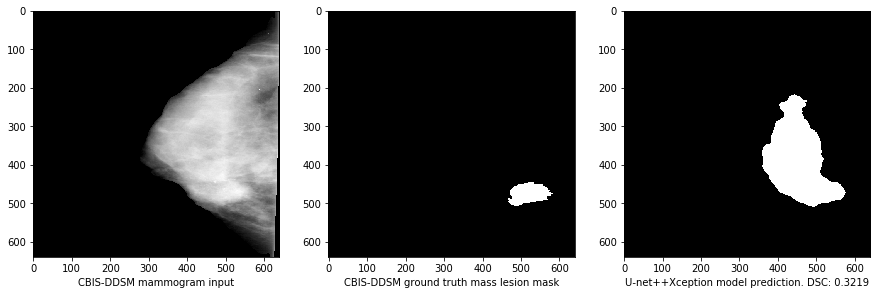

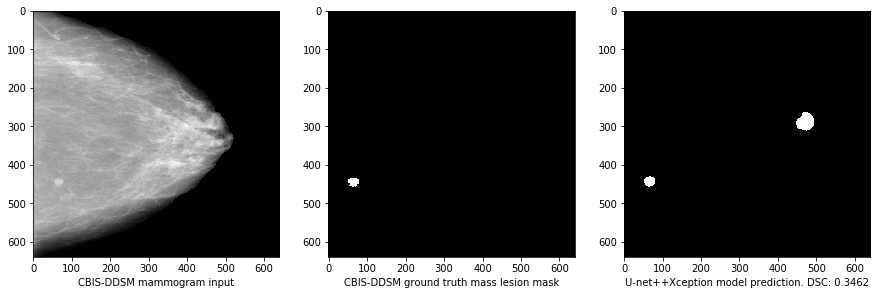

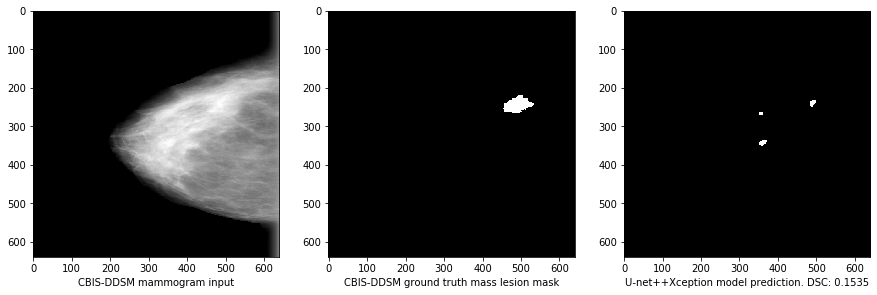

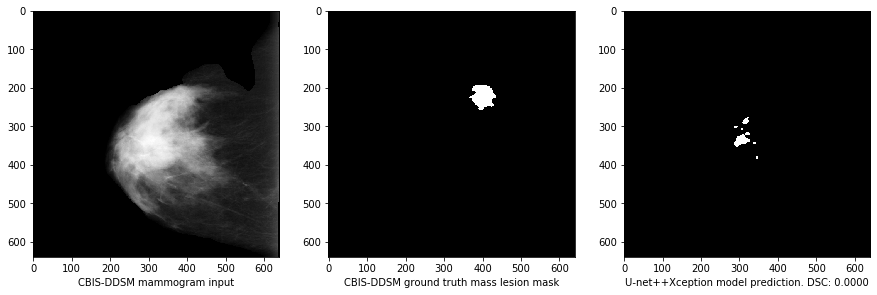

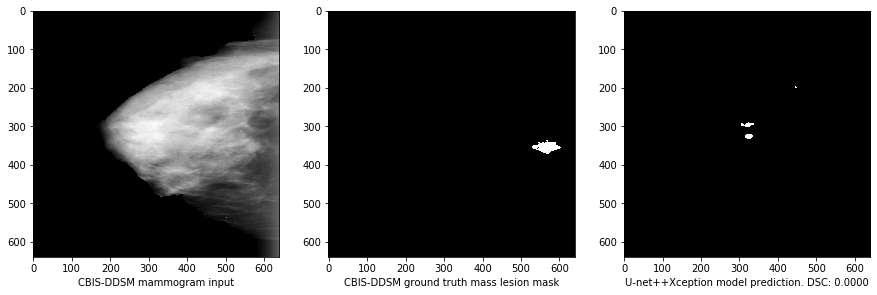

...

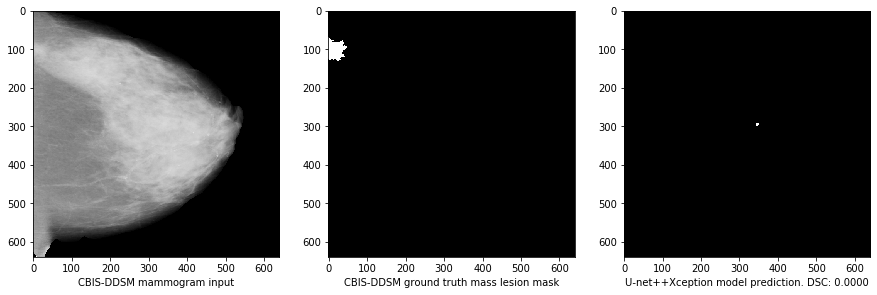

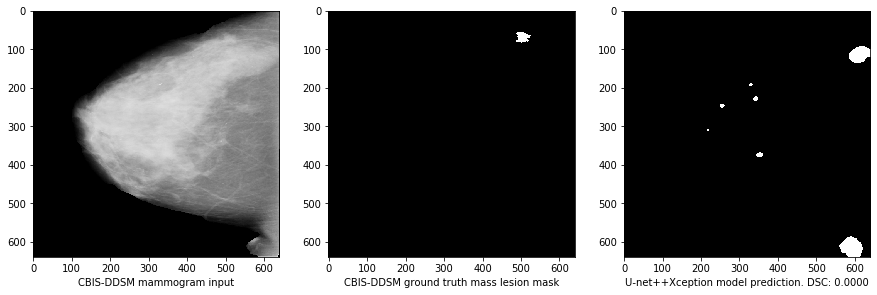

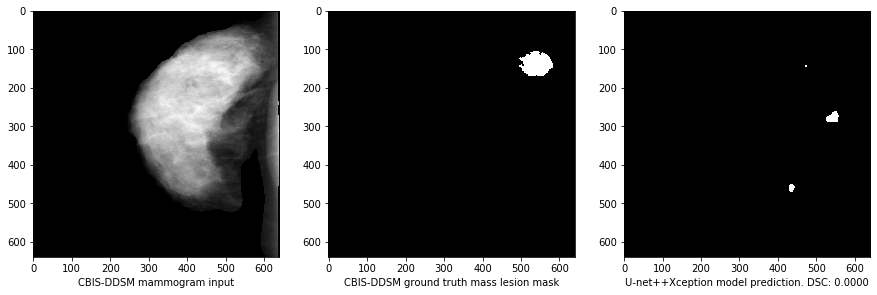

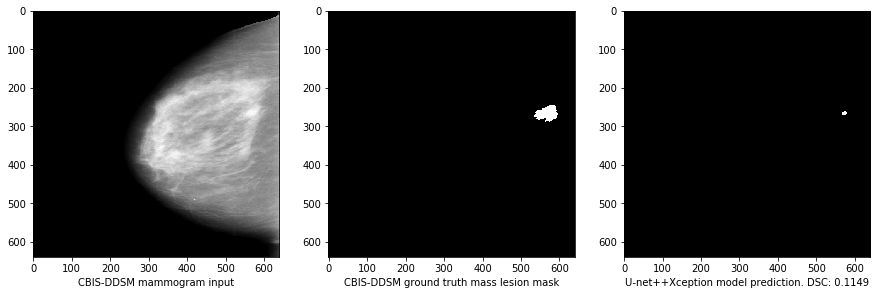

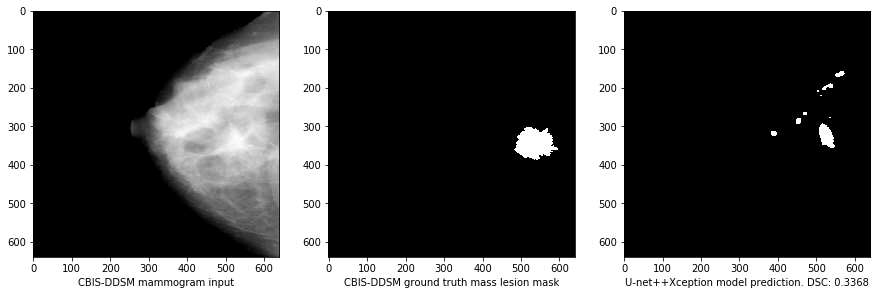

In [1]:
# MASS SEGMENTATION TEST RESULTS
# There are a total of 170 mammograms in the testing folder. Here is the result of each mammogram, its ground truth and the U-net++Xception prediction

import imageio
import os
import cv2
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure
from sklearn.metrics import roc_auc_score
import numpy as np

target_folder='pred_mass/'
dc=list() 
auc=list()

def dice_coef(y_true, y_pred):
    smooth = 1e-15
    intersection = sum(sum(y_true * y_pred))
    score = (2 * intersection + smooth) / (sum(sum(y_true)) + sum(sum(y_pred)) + smooth)
    return score

for num in range (0,170):                      # There are 170 test CBIS-DDSM images
    mg_name = str(num) + '.png'                # input mammogram
    gt_name = str(num) + '_gt.png'             # ground truth
    pred_name = str(num) + '_predict_v013.png' # unet++xception prediction
    
    mg = cv2.imread(os.path.join(target_folder,mg_name))
    gt = cv2.imread(os.path.join(target_folder,gt_name))
    gt = cv2.cvtColor(gt, cv2.COLOR_BGR2GRAY)
    pred = cv2.imread(os.path.join(target_folder,pred_name))
    pred = cv2.cvtColor(pred, cv2.COLOR_BGR2GRAY)

    # Calculate AUC ROC
    gt_flat=gt.flatten()
    pred_flat=pred.flatten()
    auc.append(roc_auc_score(gt_flat, pred_flat))
    
    ret,thresh_pred = cv2.threshold(pred,127,1,cv2.THRESH_BINARY) 
    ret,thresh_gt = cv2.threshold(gt,127,1,cv2.THRESH_BINARY) 
    dc.append(dice_coef(thresh_gt,thresh_pred))
    
    plt.rcParams.update({'figure.max_open_warning': 0}) #supress warning
    fig = plt.figure()
    fig.set_size_inches(15,15)
    ax1 = fig.add_subplot(1,3,1)
    ax1.imshow(mg)
    ax1.set_xlabel('CBIS-DDSM mammogram input')
    ax2 = fig.add_subplot(1,3,2)
    ax2.imshow(thresh_gt,cmap=plt.cm.gray)
    ax2.set_xlabel('CBIS-DDSM ground truth mass lesion mask')
    ax3 = fig.add_subplot(1,3,3)
    ax3.imshow(thresh_pred,cmap=plt.cm.gray)
    ax3.set_xlabel('U-net++Xception model prediction. DSC: {:.4f}'.format(dc[num]))


# Print mean DSC and AUC
print('Mean test DSC: {:.4f}'.format(np.mean(dc)))
print('Mean test AUC: {:.4f}'.format(np.mean(auc)))

In [2]:
print(auc)

[0.9524507917388181, 0.9839751790474395, 0.5470908311656656, 0.49844108455272157, 0.4993985305034459, 0.6044792544022739, 0.85981599869805, 0.9998236209588091, 0.499215597837011, 0.9903173551704227, 0.5, 0.9993458227112861, 0.5, 0.8437727489413093, 0.6558456496491152, 0.49427040184168275, 0.5492652874843523, 0.9927459732750276, 0.5, 0.9583272060514384, 0.9864156699993151, 0.9850567380236767, 0.499044037827741, 0.5014007470305019, 0.5, 0.5, 0.7909949733892241, 0.9456208141175997, 0.5, 0.9481339715648568, 0.5, 0.49984298716910774, 0.9699788830831892, 0.47048292290326843, 0.9209470260031313, 0.8237967326585883, 0.5, 0.9319890122910698, 0.9527683469234137, 0.5251937984496124, 0.5400394504007066, 0.9866119290500269, 0.8516403773255178, 0.5, 0.5, 0.4996031104381955, 0.6262886597938144, 0.828152281311503, 0.9921386720809726, 0.6535323768720077, 0.4998395555566442, 0.4999032059654531, 0.9857356845499161, 0.49680841961153416, 0.9810184687913092, 0.5, 0.962081219986262, 0.5, 0.5, 0.4940690542023